# TP 02: Linear Regression

## Regression analysis of the Diabetes data

### Davi BARRETO FAÇANHA

In [1]:
# Imports used at this TP
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
from sklearn import linear_model, metrics
from sklearn.linear_model import Perceptron
from sklearn.preprocessing import PolynomialFeatures

### Pre-Question 01
#### Loading the Data

In [2]:
# Openning the Archives
arquivo = open( 'data_dm3.csv' , 'r')
#arquivo.readlines()

In [3]:
data = pd.read_csv('data_dm3.csv', header=None)
n = data[0].count()
p = len(data.columns)
data

,0,1,2,3,4,5,6,7,8,9,...,201,202,203,204,205,206,207,208,209,210
0,-1.298173,-0.162249,1.223379,1.355554,1.080171,0.634979,0.298741,0.548270,0.731773,1.018645,...,0.588278,0.210106,1.861458,-0.436399,0.279299,-1.416020,-2.332363,0.215096,-0.693319,151.0
1,0.166951,-0.338060,-0.618867,0.759366,1.134281,-0.536844,-0.075120,0.970251,-0.327487,0.717310,...,-0.251054,-0.825716,0.339139,1.119430,0.225958,-0.822288,0.382838,-0.718829,-0.188993,75.0
2,-0.416177,-0.205659,-1.282226,1.675500,1.523746,0.192029,-0.235840,-1.954626,-0.853309,0.892791,...,1.283837,0.372516,-0.652557,-2.579347,0.139267,-1.901196,0.048210,0.220205,0.471588,141.0
3,0.867184,-0.398667,0.093501,0.025971,1.852099,0.789774,0.801775,0.376711,0.853689,0.247953,...,0.446582,0.334733,0.399074,-0.884172,0.723819,1.316367,0.088218,0.619496,1.061662,206.0
4,1.193282,-0.936980,-0.725039,0.766078,0.223489,-1.584622,1.146866,0.086136,-0.088780,-0.945066,...,0.786157,-1.058179,-0.155788,-0.642504,2.040010,-1.703110,-1.901502,1.778811,-0.489853,135.0
5,1.513286,0.072830,1.243039,-0.368609,-0.564998,-1.736720,-0.441544,-1.395122,-1.550146,0.941235,...,0.767162,0.417754,-1.010548,1.397951,0.074975,1.381528,-1.367316,1.200057,-0.292088,97.0
6,-0.501760,0.191544,-0.225878,-0.240506,1.350852,-1.253936,1.319458,2.007870,0.423578,0.417597,...,0.382681,-0.146417,-0.529950,-0.568923,0.340738,-1.312723,-0.366522,-0.347242,1.055200,138.0
7,-1.012528,-1.383290,0.686803,2.146420,1.255864,0.806962,0.137307,0.699977,-1.311624,-0.999770,...,-0.444868,-1.175901,0.481975,-0.329621,-1.712838,-0.047186,0.039768,-0.403074,0.249330,63.0
8,0.532639,1.691226,-0.008375,-1.478906,1.278352,-0.176214,-0.806066,0.515730,0.786887,-0.984347,...,0.183080,-0.194879,0.669917,-1.899072,0.122637,0.959231,-0.078359,-0.117192,1.664998,110.0
9,-0.537216,-0.128677,-0.815059,-1.273897,-0.985841,1.021629,-0.956690,1.009193,-0.030585,1.137275,...,-0.559667,-0.178620,1.130455,-1.158422,-0.376790,0.512715,-0.618469,1.463988,1.519603,310.0


### Question 01
Import the data set data_dm3.csv accessible by the link https://bitbucket.org/portierf/ shared_files/downloads/data_dm3.csv. The last column is the output variable Y . The other columns are the exploratory variables. Provide the number of the exploratory variables and the number of the observations.

In [4]:
print('Number of Variables: ', p)
print('Number of Observations: ', n)

Number of Variables:  211
Number of Observations:  442


### Question 02
Are the exploratory variables centered? Normalized? And the output variable? Provide a scatter plot of four randomly chosen exploratory variables and the output variable (a scatter plot or a bilot/pairwise-plot plots all possible pairs of variables). Comment the obtained graphs.

In [5]:
# Check if the data is centered
mean = data.iloc[:,0:p-1].mean()
mean_all = mean.mean()
print('Average mean: ', mean_all)

Average mean:  -1.0836006166582669e-19


**Comment:**

The average mean is very close to zero, therefore, the data is **centered**.

In [6]:
# Check if the Data is normalized
var = data.iloc[:,0:p-1].var()
print('Average variance: ', var.mean())

Average variance:  1.0022675736961446


**Comment:**

The average variance is very close to one, therefore, we can say the data is **normalized**.

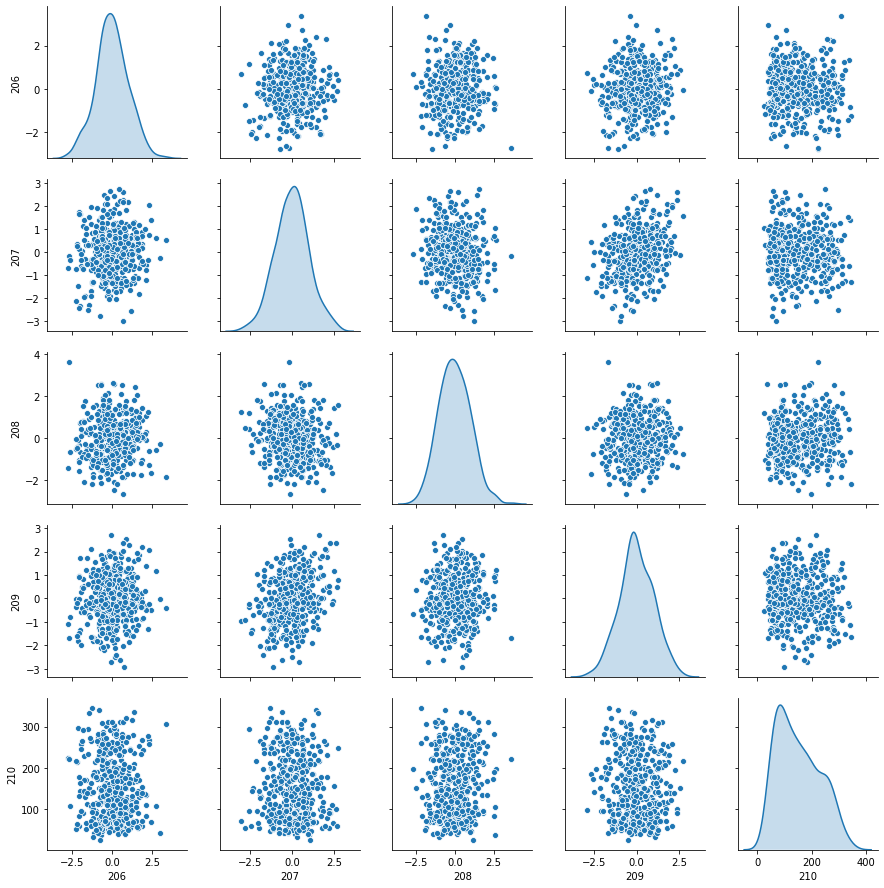

In [7]:
# Scatter plot between each pair possible selected
sns.pairplot(data.iloc[:,p-5:p], palette="Set2", diag_kind="kde")

**Comment**:

The pair plot is a scatter plot of all the features by all the features. I our case we just have chosen some of them. 

The main idea is having a general view of all the data in order to find possible correlations between the data. The most close to the diagonal is the scatter plot, the most is the correlation.

### Question 03:
Train and test sample. Create two samples: one to learn the model Xtrain and one to test it Xtest. Put 20% of the data set in the test sample. Provide the size of each of the 2 samples. Note that the new sample of the covariates Xtrain is not normalized. In what follows, please pay attention to include the intercept in the regression models.

In [8]:
# Here we calcule the index for 80% of the data. We use round
# approximate the decimal value.
train_len = int(round(0.8*n))
ones_tr = np.ones(train_len)
ones_tst = np.ones(n - train_len)

# Here we divide out data into two samples based on the index above.
# The _cov variable is just to have the samples in the Panda's format for plotting
# the covariance.
X_train_cov = data.iloc[0:train_len, 0:p-1]
X_train = data.iloc[0:train_len, 0:p-1]
X_test = data.iloc[train_len: n, 0:p-1]
X_test_cov = data.iloc[train_len: n, 0:p-1]

# Insert the Ones Column in order to count the Intercept
X_train.insert(0, "Intercept", ones_tr, True)
X_test.insert(0, "Intercept", ones_tst, True)

Y = data.iloc[:,p-1]
Y_train = data.iloc[0:train_len,p-1]
Y_test = data.iloc[train_len: n,p-1]

### Question 04:
Provide the covariance matrix for Xtrain. Plot the eigenvalues of the covariance (or correlation) matrix in descending order. Explain why does it make sense to keep only first PCA variables. In what follows, we will keep 60 variables.

In [9]:
# Correlation Matrix for the X_train set.
corr = X_train_cov.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(3)

In [10]:
# eig_vvs[0] = Eigenvalues
# eig_vvs[1] = Eigenvectors 
# from the Correlation Matrix
eig_vvs = np.linalg.eig(corr)

# Selecting only the eigenvalues
eig_vals_corr = eig_vvs[0]

In [11]:
# Get the Ordered indexes from the sorting function
corr_sorted_indexes = np.argsort(eig_vals_corr)[::-1]

# Get the Sorted Eigenvalues
eig_vals_corr = np.sort_complex(eig_vals_corr)[::-1]

Text(0, 0.5, 'Eigen-Values')

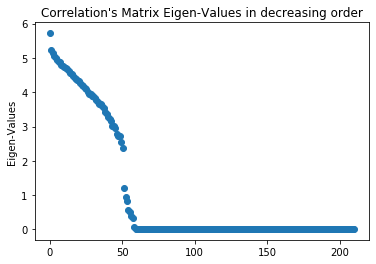

In [12]:
# Ordered Plot for the Eigen-Values
plt.scatter(np.linspace(0, len(eig_vals_corr), len(eig_vals_corr)), np.real(eig_vals_corr))

plt.title('Correlation\'s Matrix Eigen-Values in decreasing order')
plt.ylabel('Eigen-Values')

**Comment:** 

**PRINCIPAL COMPONENT ANALYSES(PCA)**: How the name sais, the main idea of using the PCA, is finding the variables that are correlated the most between them-selfs. With that, we can reduce the complexity of our data by choosing only the variables that affect the most the behavior of the data. 

And with the plot above we can see that, indeed, by the eigen-values, the behavior of the data is mostly affected only by 60 variables.

### Question 05:
Following the observations of the question (Q4), apply the method "PCA before OLS" that consists in applying OLS with Y and X train $V_{(1:60)}$ , where $V_{(1:60)}$ contains the eigenvectors (associated with the 60 largest eigenvalues) of the covariance matrix. Run linear regression (with intercept), then plot the values of the coefficients (but not for the intercept). On another graph, do the same using the classical OLS.

In [13]:
sorted_eigvects_60 = []
for i in range(60):
    j = corr_sorted_indexes[i]
    sorted_eigvects_60.append(eig_vvs[1][j])

sorted_eigvects_60 = np.transpose(sorted_eigvects_60)

# Multiplying our complete Train Set for the Ordered Eigen Vector.
# The resulting matrix will be a nx60 data instead of nxp
X_PCA_OLS = np.dot(X_train_cov, sorted_eigvects_60)
X_PCA_OLS_Test = np.dot(X_test_cov, sorted_eigvects_60)


#X_train_cov = np.transpose(X_train_cov)
#X_PCA_OLS = np.dot(sorted_eigvects_60, X_train_cov)

# Creation of the Model for PCA case
model_PCA = linear_model.LinearRegression()

# Fit the Model in PCA case
model_PCA.fit(np.real(X_PCA_OLS), Y_train)
slope_PCA = model_PCA.coef_

# Creation of the Model for Classical OLS case
model_OLS = linear_model.LinearRegression()

# Fit the Model in Classical OLS case
model_OLS.fit(X_train_cov, Y_train)
slope_OLS = model_OLS.coef_

<function matplotlib.pyplot.show(*args, **kw)>

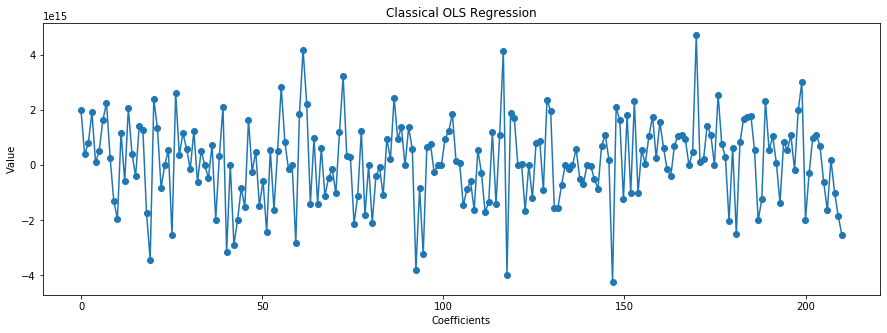

In [14]:
# Increasing the Default Figure Size
plt.figure(figsize=(15, 5))

# Scatter Plot
plt.scatter(np.linspace(0, len(slope_OLS), len(slope_OLS)), slope_OLS)
plt.xlabel('Coefficients')
plt.ylabel('Value')

# Linear Regression Plot
plt.plot(np.linspace(0, len(slope_OLS), len(slope_OLS)), slope_OLS)
plt.title('Classical OLS Regression')

#plt.legend()

plt.show

<function matplotlib.pyplot.show(*args, **kw)>

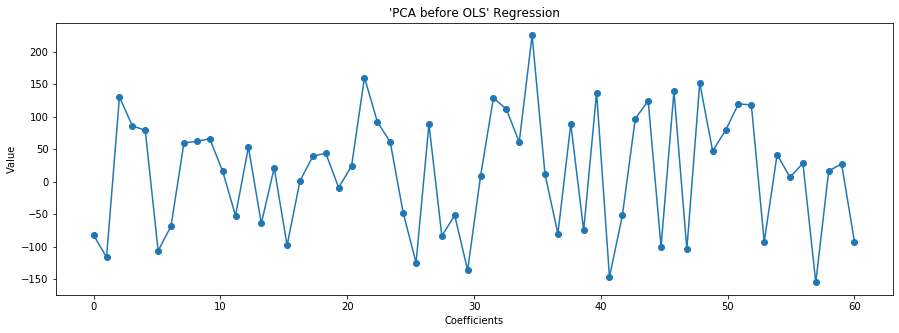

In [15]:
# Increasing the Default Figure Size
plt.figure(figsize=(15, 5))

# Scatter Plot
plt.scatter(np.linspace(0, len(slope_PCA), len(slope_PCA)), slope_PCA)
plt.xlabel('Coefficients')
plt.ylabel('Value')

# Linear Regression Plot
plt.plot(np.linspace(0, len(slope_PCA), len(slope_PCA)), slope_PCA)
plt.title('\'PCA before OLS\' Regression')

#plt.legend()

plt.show

### Question 06:
Provide the intercept values for the 2 regressions from the previous question. Also, provide the
mean value of the output variable Y (for the train set). Are the two intercepts equal? Comment.
Exceptionally for this question, center and normalize the variables after PCA (the low dimensional
ones). Run the regression and verify that the intercept is equal to the average of Y on the train
set.

In [16]:
# Intercepts for each case
intercept_PCA = model_PCA.intercept_
intercept_OLS = model_OLS.intercept_

# Mean of the Train Sample Output
Y_train_mean = Y_train.mean()

# Centralization and Normalization of PCA variables
X_PCA_CN = []
for i in range(60):
    aux = (X_PCA_OLS.transpose()[i] - X_PCA_OLS.transpose().mean())/X_PCA_OLS.transpose()[i].max()
    X_PCA_CN.append(aux)
X_PCA_CN = np.transpose(X_PCA_CN)

# Model for the Centralized PCA variables
model_PCA_C = linear_model.LinearRegression()
model_PCA_C.fit(np.real(X_PCA_CN), Y_train)

# Residual difference between the mean Y and the PCA intercept
resid = abs(Y_train_mean - model_PCA_C.intercept_)

In [17]:
print('Intercept from PCA Regression: ', intercept_PCA)
print('Intercept from Classical OLS Regression: ', intercept_OLS)
print('Intercept from Centered and Normalized Variables: ', model_PCA_C.intercept_)
print('Output\'s Mean: ', Y_train_mean)
print('Residual between Average Y and Intercept Norm. and Cent.:', resid)
print('Residual between Intercepts with and withou PCA:', abs(intercept_OLS-intercept_PCA))

Intercept from PCA Regression:  151.23337586330103
Intercept from Classical OLS Regression:  151.79625706214688
Intercept from Centered and Normalized Variables:  151.13118828572448
Output's Mean:  151.35875706214688
Residual between Average Y and Intercept Norm. and Cent.: 0.2275687764224017
Residual between Intercepts with and withou PCA: 0.5628811988458438


**Comment:**

We can see that the two intercepts are really close. Therefore, the greater difference of the PCA is gonna appear at the slope coefficients. 

That happens because the idea of using PCA is reducing the variables to the important ones. With that, the intercept, which is not directly linked to the variables, is not gonna change a lot. 

### Question 07:
For the two methods (OLS and PCA before OLS): Plot the residuals of the prediction for the test
sample. Plot their density (one can use a histogram for example). Calculate the determination
coefficient for the test sample. Calculate the prediction risk for the test sample.

<function matplotlib.pyplot.show(*args, **kw)>

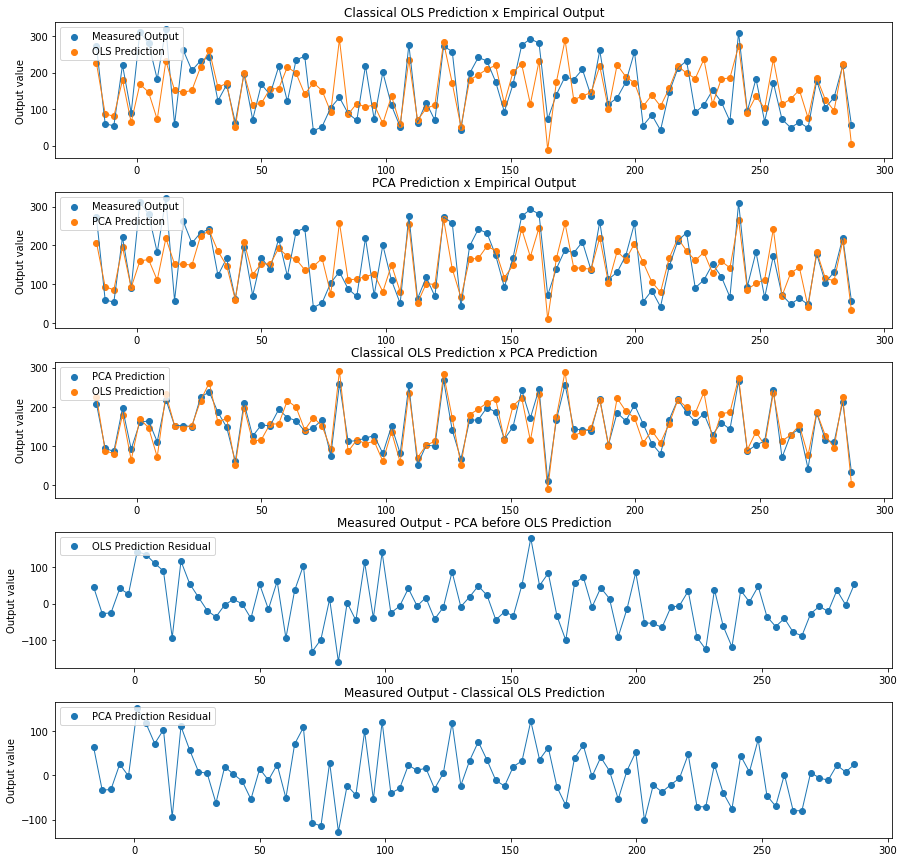

In [18]:
Y_pred_OLS = intercept_OLS + X_test_cov.dot(slope_OLS)
X_pred_OLS = np.linspace(min(Y_pred_OLS)-5, max(Y_pred_OLS)-5, len(Y_pred_OLS))

Y_pred_PCA = intercept_PCA + np.real(X_PCA_OLS_Test).dot(slope_PCA)
X_pred_PCA = np.linspace(min(Y_pred_PCA)-5, max(Y_pred_PCA)-5, len(Y_pred_PCA))


# Increasing the Default Figure Size
plt.figure(figsize=(15, 15))
plt.subplots_adjust(hspace=.25)

### Subplot 01
plt.subplot(5, 1, 1)

plt.scatter(X_pred_OLS, Y_test, label='Measured Output')
plt.scatter(X_pred_OLS, Y_pred_OLS, label='OLS Prediction')

plt.plot(X_pred_OLS, Y_test, linewidth=1)
plt.plot(X_pred_OLS, Y_pred_OLS, linewidth=1)

plt.title('Classical OLS Prediction x Empirical Output')
plt.ylabel('Output value')

plt.legend(loc='upper left')

### Subplot 02
plt.subplot(5, 1, 2)

plt.scatter(X_pred_OLS, Y_test, label='Measured Output')
plt.scatter(X_pred_OLS, Y_pred_PCA, label='PCA Prediction')

plt.plot(X_pred_OLS, Y_test, linewidth=1)
plt.plot(X_pred_OLS, Y_pred_PCA, linewidth=1)

plt.title('PCA Prediction x Empirical Output')
plt.ylabel('Output value')

plt.legend(loc='upper left')

### Subplot 03
plt.subplot(5, 1, 3)

plt.scatter(X_pred_OLS, Y_pred_PCA, label='PCA Prediction')
plt.scatter(X_pred_OLS, Y_pred_OLS, label='OLS Prediction')
#plt.scatter(X_pred_OLS, Y_train, color='grey', label='Measured Output')

plt.plot(X_pred_OLS, Y_pred_PCA, linewidth=1)
plt.plot(X_pred_OLS, Y_pred_OLS, linewidth=1)
#plt.plot(X_pred_OLS, Y_train, 'grey')

plt.title('Classical OLS Prediction x PCA Prediction')
plt.ylabel('Output value')

plt.legend(loc='upper left')

### Subplot 04
plt.subplot(5, 1, 4)

plt.scatter(X_pred_OLS, Y_test - Y_pred_OLS, label='OLS Prediction Residual')

plt.plot(X_pred_OLS, Y_test - Y_pred_OLS, linewidth=1)

plt.title('Measured Output - PCA before OLS Prediction')
plt.ylabel('Output value')

plt.legend(loc='upper left')

### Subplot 05
plt.subplot(5, 1, 5)

plt.scatter(X_pred_OLS, Y_test - Y_pred_PCA, label='PCA Prediction Residual')

plt.plot(X_pred_OLS, Y_test - Y_pred_PCA, linewidth=1)

plt.title('Measured Output - Classical OLS Prediction')
plt.ylabel('Output value')

plt.legend(loc='upper left')

plt.show

Text(0.5, 1.0, 'Overlapping Densities')

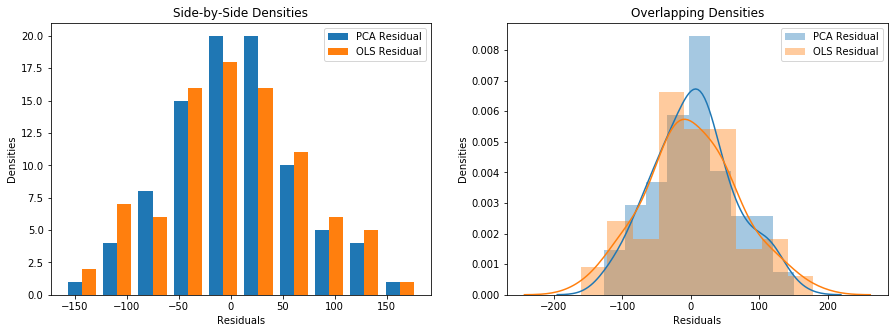

In [19]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)

plt.hist([(Y_test - Y_pred_PCA), (Y_test - Y_pred_OLS)], label=['PCA Residual','OLS Residual'])

# Plot formatting
plt.legend()
plt.xlabel('Residuals')
plt.ylabel('Densities')
plt.title('Side-by-Side Densities')

plt.subplot(1, 2, 2)

sns.distplot((Y_test - Y_pred_PCA), label='PCA Residual')
sns.distplot((Y_test - Y_pred_OLS), label='OLS Residual')

plt.legend()
plt.xlabel('Residuals')
plt.ylabel('Densities')
plt.title('Overlapping Densities')

In [20]:
# Determination Coefficient for the PCA case
R_2_PCA = 1 - sum((Y_test - Y_pred_PCA)**2)/sum((Y_test - Y_test.mean())**2)

# Determination Coefficient for the OLS case
R_2_OLS = 1 - sum((Y_test - Y_pred_OLS)**2)/sum((Y_test - Y_test.mean())**2)

In [21]:
# Prediction Risk for the PCA case:
Pred_Risk_PCA = np.linalg.norm((np.array(Y_test) - Y_pred_PCA))**2/(n-train_len)

# Prediction Risk for the OLS case:
Pred_Risk_OlS = np.linalg.norm((np.array(Y_test) - Y_pred_OLS))**2/(n-train_len)

In [22]:
print('Determination Coefficient for the PCA case: ', R_2_PCA)
print('Determination Coefficient for the OLS case: ', R_2_OLS)
print('Prediction Risk for the PCA case: ', Pred_Risk_PCA)
print('Prediction Risk for the OLS case: ', Pred_Risk_OlS)

Determination Coefficient for the PCA case:  0.4523132605118855
Determination Coefficient for the OLS case:  0.3032221475781226
Prediction Risk for the PCA case:  3543.922186547395
Prediction Risk for the OLS case:  4508.647575803369


### Question 08:
Program the method of the forward variable selection. You can use the test statistics of the test
for nullity (as seen during the course). For the moment, do not define the stop criterion for the
method, i.e. add a variable at each time until all the variables are selected. Provide the order of
the variable selection.

In [23]:
# This sub-function is created to find the index with the 
# maximum Statistique(T) value given an X and Y input

def find_max(X, Y):
    # The fwrd_variable_select() already convert the Y df into
    # an array, so here r just receives it.
    r = Y
    
    # The input X becames the X_k for each k iteration
    X_k = np.array(X)
    
    # This S instance ends as a vector of all the T values
    S = []
    
    # Linear Model Creation
    model = linear_model.LinearRegression()

    for i in range(len(X.columns)):
        # This x_aux is created because of the need of appending 
        # the 1's vector to each column in order to find the Gram Matrix
        x_aux = []
        x_aux.append(np.ones(train_len))
        x_aux.append(X_k[:,i])
        x_aux = np.transpose(x_aux)
        
        Gram_Matrix = np.dot(np.transpose(x_aux), x_aux)/train_len
        
        # s parameter of the Statistic Equation (T)
        s = np.sqrt(np.linalg.inv(Gram_Matrix)[0,0])
        
        # Model Coefficients 
        model.fit(X_k[:,i].reshape(-1,1), r)
        intercept = model.intercept_
        slope = model.coef_
        
        # Sigma parameter of the Statistic Equation (T)
        sigma = np.sqrt(((train_len - 2)**(-1))*np.linalg.norm(r - intercept - slope*X_k[:,i])**2)
        
        # Statics Equation
        T = abs(slope*(np.sqrt(train_len))/(s*sigma))
        
        # Vector for each T
        S.append(float(T))
    
    # So we sort the vector of Ts in descending order and return the 
    # first index value, therefore, the index of biggest value
    max_i = np.argsort(S)[::-1]
    max_T = np.sort(S)[::-1]
    
    return max_i[0], max_T[0]

In [24]:
# The main function that applies the find_max() into each iteration

def fwrd_variable_select(X, Y):
    
    # Initialize X
    Input = X.copy()
    
    # Initialize Y
    r = np.array(Y)
    
    # Initialize S
    S = []
    
    # Initialize p_values
    PVs = []
    
    #Create Model
    model = linear_model.LinearRegression()
    
    for i in range(210):
        # Find the max index for each X and Y
        max_i, max_T = find_max(Input, r)
        
        p_value = 2*(1-stats.norm.cdf(max_T))
        
        PVs.append(p_value)
        
        # Guard the index
        S.append(max_i)
        
        # Model Fit for each X and Y
        model.fit(np.array(Input)[:,max_i].reshape(-1,1), r)
        
        # Prediction of Y given the column with best T
        r_plus = model.predict(np.array(Input)[:,max_i].reshape(-1,1))
        
        # Update of r
        r = r - r_plus
        
        # Update of X
        Input = Input.drop([Input.columns[max_i]],  axis='columns')
    
    return S, PVs

In [25]:
order_all, P_values_all = fwrd_variable_select(X_train_cov, Y_train)

In [26]:
print('Order for the Variable Selection:', order_all)

Order for the Variable Selection: [58, 122, 127, 13, 204, 129, 162, 133, 195, 130, 166, 109, 71, 44, 4, 80, 46, 151, 83, 53, 148, 17, 78, 177, 184, 20, 90, 78, 48, 69, 30, 83, 38, 86, 76, 113, 132, 77, 52, 56, 138, 106, 29, 136, 125, 53, 49, 141, 59, 93, 82, 15, 45, 13, 0, 141, 77, 54, 132, 67, 54, 63, 93, 64, 129, 4, 8, 25, 87, 72, 101, 102, 123, 113, 134, 76, 120, 29, 100, 39, 106, 95, 80, 3, 49, 20, 72, 110, 57, 49, 92, 46, 112, 52, 5, 114, 28, 55, 83, 107, 21, 64, 58, 20, 1, 22, 48, 1, 57, 38, 30, 74, 94, 6, 71, 32, 18, 19, 77, 27, 69, 29, 64, 67, 30, 10, 14, 30, 0, 6, 68, 53, 43, 7, 56, 26, 41, 3, 66, 6, 47, 55, 59, 39, 27, 26, 18, 51, 53, 49, 26, 9, 16, 15, 16, 27, 7, 41, 11, 47, 19, 20, 19, 33, 23, 38, 15, 21, 40, 7, 34, 31, 36, 21, 8, 2, 15, 26, 11, 1, 2, 17, 13, 23, 24, 22, 18, 1, 6, 10, 2, 3, 0, 16, 6, 6, 4, 1, 3, 8, 4, 8, 4, 2, 2, 4, 0, 1, 0, 0]


### Question 09:
Stop criterion: We choose to stop if the p-value is larger than 0.1. Illustrate the method providing
(i) the 3 graphs of the test statistics obtained when selecting the 1st, 2nd and 3rd variables (in
abscissa: the indices of the variables; in the ordinate: the value of the test statics), (ii) the graphs of
the first 50 p-values (each associated to a selected variable). On the same plot, trace the horizontal
line with the ordinate 0.1. Finally, provide the list of the selected variables.

In [27]:
# This sub-function is created to find the index with the 
# maximum Statistique(T) value given an X and Y input

def find_max2(X, Y):
    # The fwrd_variable_select() already convert the Y df into
    # an array, so here r just receives it.
    r = Y
    
    # The input X becames the X_k for each k iteration
    X_k = np.array(X)
    
    # This S instance ends as a vector of all the T values
    S = []
    
    # Linear Model Creation
    model = linear_model.LinearRegression()

    for i in range(len(X.columns)):
        # This x_aux is created because of the need of appending 
        # the 1's vector to each column in order to find the Gram Matrix
        x_aux = []
        x_aux.append(np.ones(train_len))
        x_aux.append(X_k[:,i])
        x_aux = np.transpose(x_aux)
        
        if max(X_k[:,i]) == 0:
            T = 0
        
        else:
            Gram_Matrix = np.dot(np.transpose(x_aux), x_aux)/train_len

            # s parameter of the Statistic Equation (T)
            s = np.sqrt(np.linalg.inv(Gram_Matrix)[0,0])

            # Model Coefficients 
            model.fit(X_k[:,i].reshape(-1,1), r)
            intercept = model.intercept_
            slope = model.coef_

            # Sigma parameter of the Statistic Equation (T)
            sigma = np.sqrt(((train_len - 2)**(-1))*np.linalg.norm(r - intercept - slope*X_k[:,i])**2)

            # Statics Equation
            T = abs(slope)*(np.sqrt(train_len))/(s*sigma)

        # Vector for each T
        S.append(float(T))
            
    # So we sort the vector of Ts in descending order and return the 
    # first index value, therefore, the index of boggest value
    max_i = np.argsort(S)[::-1]
    max_T = np.sort(S)[::-1]
    
    return max_i[0], max_T[0], S

In [28]:
# The main function that applies the find_max() into each iteration

def fwrd_variable_select2(X, Y):
    
    # Initialize X
    Input = X.copy()
    
    # Initialize Y
    r = np.array(Y)
    
    # Initialize S
    S = []
    
    ## Initialize Stats
    Stats = []
    
    ## Initialize p_values
    PVs = []
    Tests_all = []
    
    #Create Model
    model = linear_model.LinearRegression()
    
    for i in range(210):
        # Find the max index for each X and Y
        max_i, max_T, Tests = find_max2(Input, r)
        
        p_value = 2*(1-stats.norm.cdf(max_T))
        
        if p_value > 0.1:
            return S, Stats, PVs, Tests_all
        
        else:
            # Guard the index
            S.append(max_i)
        
            ## Guard the Stat
            Stats.append(max_T)
            
            ## Guard the P_Value
            PVs.append(p_value)
            Tests_all.append(Tests)
            
            # Model Fit for each X and Y
            model.fit(np.array(Input)[:,max_i].reshape(-1,1), r)

            # Prediction of Y given the column with best T
            r_plus = model.predict(np.array(Input)[:,max_i].reshape(-1,1))

            # Update of r
            r = r - r_plus

            # Update of X
            #Input = Input.drop([Input.columns[max_i]],  axis='columns')
            Input.iloc[:,max_i] = np.zeros(len(Input.iloc[:,max_i]))
    
            
    return S, Stats, PVs, Tests_all

In [29]:
# Call of the function
order_best, Stats, P_values_best, Test = fwrd_variable_select2(X_train_cov, Y_train)

In [30]:
print('Order for the Variable Selection with stop criteria: ', order_best)

Order for the Variable Selection with stop criteria:  [58, 123, 129, 13, 208, 133, 167, 138, 202, 135, 174]


<function matplotlib.pyplot.show(*args, **kw)>

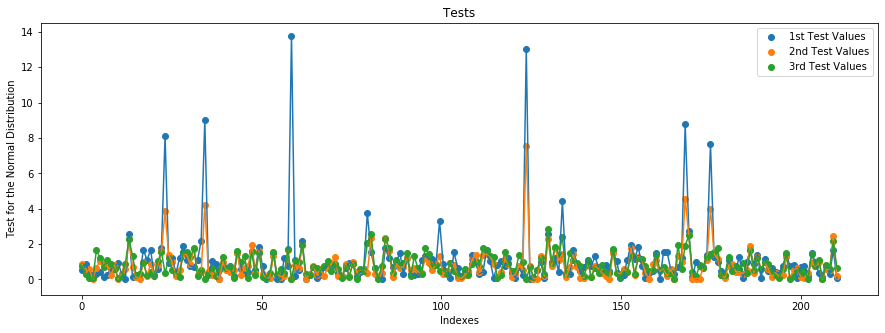

In [31]:
# Increasing the Default Figure Size
plt.figure(figsize=(15, 5))

# Scatter Plot
plt.scatter(np.linspace(0, len(Test[0]), len(Test[0])), Test[0], label='1st Test Values')
# Linear Regression Plot
plt.plot(np.linspace(0, len(Test[0]), len(Test[0])), Test[0])


# Scatter Plot
plt.scatter(np.linspace(0, len(Test[1]), len(Test[1])), Test[1], label='2nd Test Values')
# Linear Regression Plot
plt.plot(np.linspace(0, len(Test[1]), len(Test[1])), Test[1])


# Scatter Plot
plt.scatter(np.linspace(0, len(Test[2]), len(Test[2])), Test[2], label='3rd Test Values')
# Linear Regression Plot
plt.plot(np.linspace(0, len(Test[2]), len(Test[2])), Test[2])


plt.xlabel('Indexes')
plt.ylabel('Test for the Normal Distribution')
plt.title('Tests')

plt.legend()

plt.show

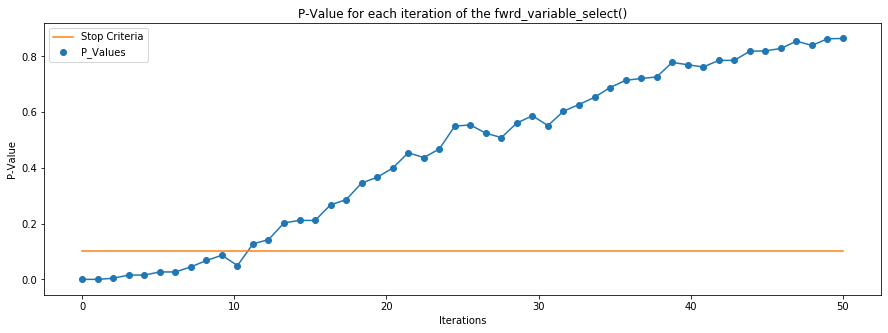

In [32]:
# Increasing the Default Figure Size
plt.figure(figsize=(15, 5))

# P-Values Scatter Plot
plt.scatter(np.linspace(0, 50, 50), P_values_all[:50], label='P_Values')
# P-Values Plot
plt.plot(np.linspace(0, len(P_values_all[:50]), len(P_values_all[:50])), P_values_all[:50])

# Stop Criteria Line
plt.plot(np.linspace(0, 50, 50), np.ones(50)/10, label='Stop Criteria')

plt.xlabel('Iterations')
plt.ylabel('P-Value')
plt.title('P-Value for each iteration of the fwrd_variable_select()')

plt.legend()

plt.show()

### Question 10:
Run OLS on the selected variables. Provide the prediction risk for the test sample and compare
with those for OLS and PCA before OLS.

In [33]:
# Creation of the Model for Classical OLS case
model_OLS_Selected = linear_model.LinearRegression()

# Fit the Model for the selected variables
model_OLS_Selected.fit(X_train_cov.iloc[:,order_best], Y_train)
slope_OLS_Selected = model_OLS_Selected.coef_

# Prediction Risk for the Selected Variables using OLS
Y_Pred_Selected_Var = model_OLS_Selected.predict(X_test_cov.iloc[:,order_best])

# Prediction Risk for the Selected Variables using OLS
Pred_Risk_OLS_Selected = np.linalg.norm((np.array(Y_test) - Y_Pred_Selected_Var))**2/(n-train_len)

In [34]:
print('Prediction Risk for the PCA case: ', Pred_Risk_PCA)
print('Prediction Risk for the OLS case: ', Pred_Risk_OlS)
print('Prediction Risk for Selected Variables with Foward Variable Selection: ', Pred_Risk_OLS_Selected)

Prediction Risk for the PCA case:  3543.922186547395
Prediction Risk for the OLS case:  4508.647575803369
Prediction Risk for Selected Variables with Foward Variable Selection:  3510.4209722439537


**Comment:**
    
By the Prediction Risk values above, we can see the the 'Most Important Variables' selection of the Forward Variable Selection is a little better than the Dimension Reduction proportionated by the PCA.

### Question 11:
To prepare for the cross-validation, split randomly the train sample in 4 equal parts (called “folds”).
Provide the numbers of the observations falling into each fold.

In [35]:
# Set a data including the Y for making the shuffle and the folds
Data_Cross = data.iloc[0:train_len, 0:p]

# Mixing and dividing
shuffled = Data_Cross.sample(frac=1)
folds = np.array_split(shuffled, 4)

### Question 12:
Apply the ridge regression method. For the choice of the regularization parameter, run the cross-
validation on the “folds” defined in the previous question. Each “fold” is used to calculate the
prediction risk while the resting ones are used for estimating the model. Then the 4 risks are
averaged. Plot the estimated risk curve as a function of the regularization parameter (pay attention
when choosing the range for the values of the regularization parameter). Provide the optimal
regularization parameter and the corresponding risk for the test sample.

$$\hat{\theta}n^{(rdg)} \in \arg \min{{\theta}} ||Y - X \theta||^2_2 + n \lambda ||\theta||^2_2$$

$$\hat{\theta}_n^{(rdg)} = (X^TX + n \lambda I_p)^{-1}X^TY$$

$$\hat{R}(\lambda) = \frac{1}{K}\sum^K_{k = 1} \frac{1}{n}||Y_{(k)} - X_{(k)} \hat{\theta}_{n,k}^{(rdg)}||^2$$

In [36]:
# Lambdas Sequence for the iterations
lambs = np.linspace(0.1, 1.2, 100)

R_all = []
for i in range(len(lambs)):
    R = []
    for j in range(len(folds)):
        samples = folds.copy()
        chosen_fold = samples[j] - samples[j].mean()
        samples.pop(j)
        rest_fold = pd.concat(samples[:])
        rest_fold = rest_fold - rest_fold.mean()
            
        theta = np.linalg.inv(np.dot(rest_fold.iloc[:,:p-1].T, rest_fold.iloc[:,:p-1]) + len(rest_fold)*lambs[i]*np.identity(p-1))
        theta = np.dot(theta, np.dot(rest_fold.iloc[:,:p-1].T, rest_fold.iloc[:,:p]))
        
        R_lamb = (np.linalg.norm(chosen_fold.iloc[:,:p] - np.dot(chosen_fold.iloc[:,:p-1], theta))**2)/len(chosen_fold)
        R.append(R_lamb)
    
    R_all.append(np.mean(R))

<function matplotlib.pyplot.show(*args, **kw)>

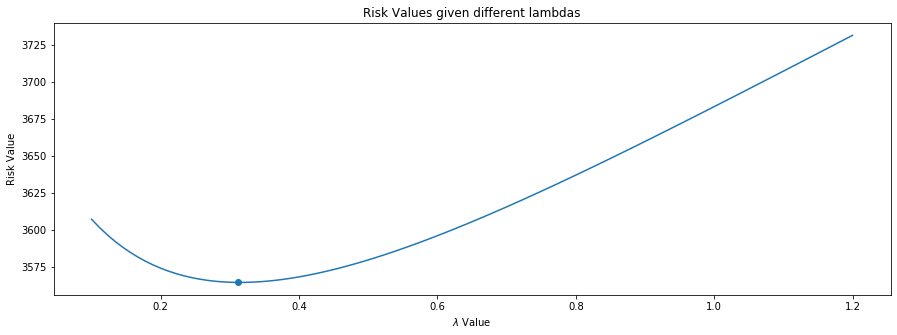

In [37]:
# Increasing the Default Figure Size
plt.figure(figsize=(15, 5))

# Scatter Plot
plt.scatter(lambs[np.argmin(R_all)], min(R_all))
plt.gca().set_xlabel(r'$\lambda$ Value')
plt.ylabel('Risk Value')

# Linear Regression Plot
plt.plot(lambs, R_all)
plt.title('Risk Values given different lambdas')

#plt.legend()

plt.show

### Question 13:
Using the function lassoCV of the library sklearn, choose the regularization parameter for the
LASSO. Provide the corresponding risk.

In [38]:
lasso_model = linear_model.LassoCV(cv = 4).fit(X_train_cov, Y_train)
R_lasso = (np.linalg.norm(np.array(Y_test) - lasso_model.predict(X_test_cov))**2)/(n-train_len)

In [39]:
lasso_model.coef_

array([ 0.        ,  0.        , -0.        ,  0.        , -0.        ,
        0.        ,  0.        , -0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  1.18454766, -0.        ,
        0.        ,  0.        , -0.        ,  0.        ,  0.        ,
       -0.        , -0.        ,  0.        ,  0.        , -0.        ,
        0.        , -0.        , -0.        ,  0.        ,  0.        ,
        0.        , -0.        , -0.        , -0.        ,  0.        ,
        0.        ,  0.        ,  0.        , -0.        ,  0.        ,
        0.        ,  0.        , -0.        , -0.        ,  0.        ,
       -0.        ,  0.        ,  0.        , -0.        , -0.        ,
       -0.        , -0.        , -0.        , -0.        ,  0.        ,
       -0.        ,  0.        , -0.        , 22.96070419, -0.        ,
       -0.        ,  0.22884173,  0.        ,  0.        , -0.        ,
       -0.        , -0.        ,  0.        , -0.        ,  0.  

In [40]:
print('Lambda value for the Lasso method: ', lasso_model.alpha_)
print('Prediction Risk for the Lasso method: ', R_lasso)

Lambda value for the Lasso method:  6.544612799608695
Prediction Risk for the Lasso method:  3283.7991809931436


### Question 14:
Provide the variables selected by the LASSO. How many are they? Apply the OLS method to the
selected variables. This method is called Least-square LASSO.

In [41]:
lasso_selection = []
for i in range(len(lasso_model.coef_)):
    if lasso_model.coef_[i] != 0:
        lasso_selection.append(i)

In [42]:
OLS_Lasso = linear_model.LinearRegression()
OLS_Lasso.fit(X_train_cov.iloc[:,lasso_selection], Y_train)

OLS_Lasso_Pred = OLS_Lasso.predict(X_test_cov.iloc[:,lasso_selection])

Pred_Risk_OLS_Lasso = (np.linalg.norm(Y_test - OLS_Lasso_Pred)**2)/(n-train_len)

In [43]:
print('Prediction Risk for the PCA case: ', Pred_Risk_PCA)
print('Prediction Risk for the OLS case: ', Pred_Risk_OlS)
print('Prediction Risk for Selected Variables with the Forward Variable Selection: ', Pred_Risk_OLS_Selected)
print('Prediction Risk for Selected Variables with Lasso OLS: ', Pred_Risk_OLS_Lasso)

Prediction Risk for the PCA case:  3543.922186547395
Prediction Risk for the OLS case:  4508.647575803369
Prediction Risk for Selected Variables with :  3510.4209722439537
Prediction Risk for Selected Variables with Lasso OLS:  3550.1270275899715


In [44]:
print('Variables Selecteds by Lasso:', lasso_selection)
print('How many are they...:', len(lasso_selection))

Variables Selecteds by Lasso: [13, 58, 61, 123, 129, 167, 168, 174]
How many are they...: 8


### Question 15:
This last question is an outlook for the non-linear approach. Using the variables selected by the
LASSO, (Q13) or by the forward selection method (Q9), develop the method of the non-linear
regression. Learn the different parameters using the cross-validation and provide the risk for the
test sample. It is possible to have worse performance than the OLS method. Comment.

In [45]:
Y = Y_train.copy()

X_test_Poly = PolynomialFeatures(interaction_only=True).fit_transform(X_test_cov).astype(float)
X_train_Poly = PolynomialFeatures(interaction_only=True).fit_transform(X_train_cov).astype(float)

In [46]:
Model_Polynomial = linear_model.LassoCV(cv = 4).fit(X_train_Poly, Y)

In [47]:
Pred_NonLin = Model_Polynomial.predict(X_test_Poly)

In [48]:
R_NL = (np.linalg.norm(Y_test - Pred_NonLin)**2)/(n-train_len)

In [49]:
print('Risk Prediction for the Non-Linear Method: ',R_NL)

Risk Prediction for the Non-Linear Method:  3366.0300872929674


**Comment**:

So, by this method above, we found a better Risk than all the other ones.